In [1]:
import tensorflow as tf
import tensorflow_probability as tfp
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
from importlib import reload
from ea_data_loader import load_ea_data

%load_ext autoreload
%autoreload 2


tfd = tfp.distributions
tfb = tfp.bijectors
dtype = np.float32
plt.style.use('ggplot')

In [122]:
data, subdf, score = load_ea_data(vid=0)
m, q, t = data.shape

print(data.shape)

(372, 400, 85)


In [123]:
from shared_gpfa import SharedGpfa

p = 20
model = SharedGpfa(m, q, p, t, reg=.155)
l = model.fit(train_data=data, n_iters=2000, learning_rate=0.06, tensorboard=False)

100%|██████████| 2000/2000 [00:51<00:00, 38.66it/s]


tfp.distributions.JointDistributionNamed("JointDistributionNamed", batch_shape={obs: [], x: []}, event_shape={obs: [372, 400, 85], x: [20, 85]}, dtype={obs: float32, x: float32})


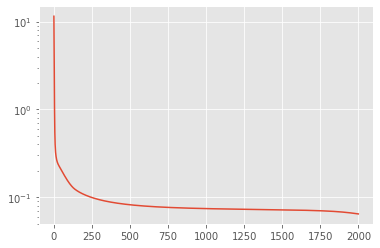

In [124]:
print(model.joint)
plt.style.use('ggplot')

plt.figure()
plt.plot(l)
plt.yscale('log')

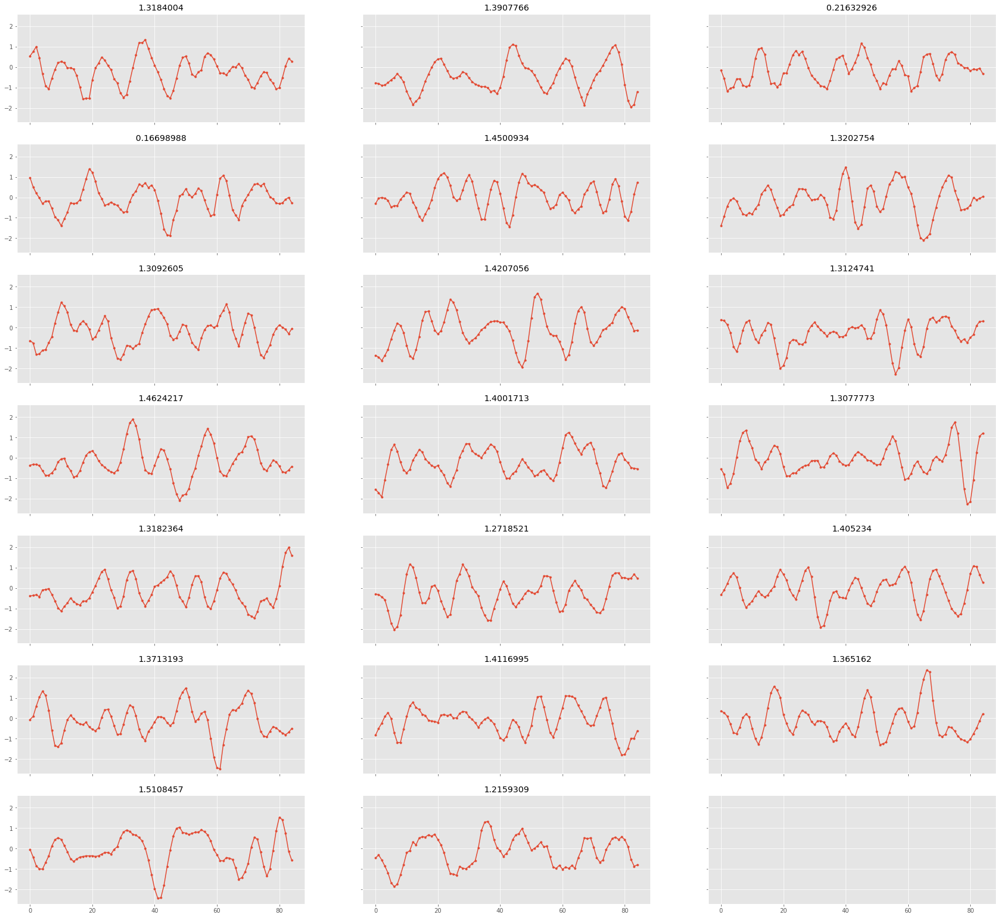

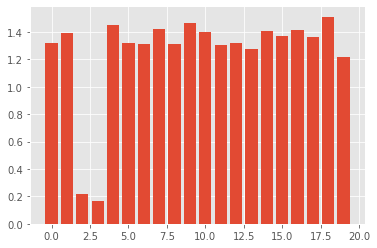

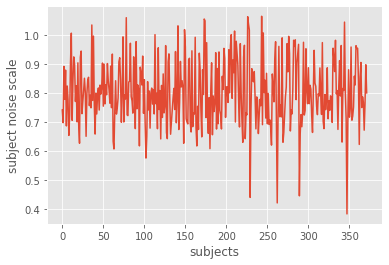

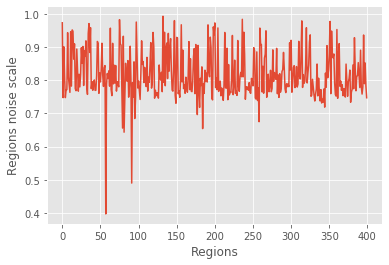

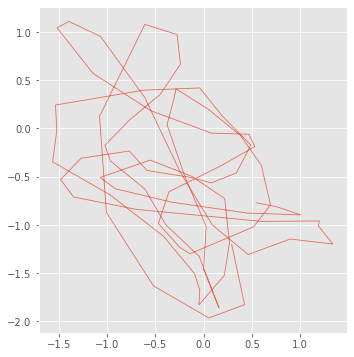

In [125]:
x = model.vars['x'].numpy()
xsample = model.joint.sample()['x'].numpy()
length_scale = tf.convert_to_tensor(model.vars['length_scale']).numpy()

n_rows = model.p//3 + 1
fig, axs = plt.subplots(n_rows, 3, figsize=(30, n_rows * 4), sharex=True, sharey=True)
for xx, xxs, l, ax in zip(x, xsample, length_scale, axs.flat):
    ax.plot(np.arange(t), xx, marker='.')
    # ax.plot(np.arange(t), xxs, marker='.')
    ax.set_title(l)

plt.figure()
plt.bar(np.arange(model.p), length_scale)

plt.figure()
plt.plot(tf.convert_to_tensor(model.vars['subject_noise_scale']))
plt.xlabel('subjects')
plt.ylabel('subject noise scale')

plt.figure()
plt.plot(tf.convert_to_tensor(model.vars['roi_noise_scale']))
plt.xlabel('Regions')
plt.ylabel('Regions noise scale')

fig, ax = plt.subplots(figsize=(6,6))
ax.plot(*x[0:2], lw=0.8, alpha=0.8)
ax.set_aspect('equal', 'box')


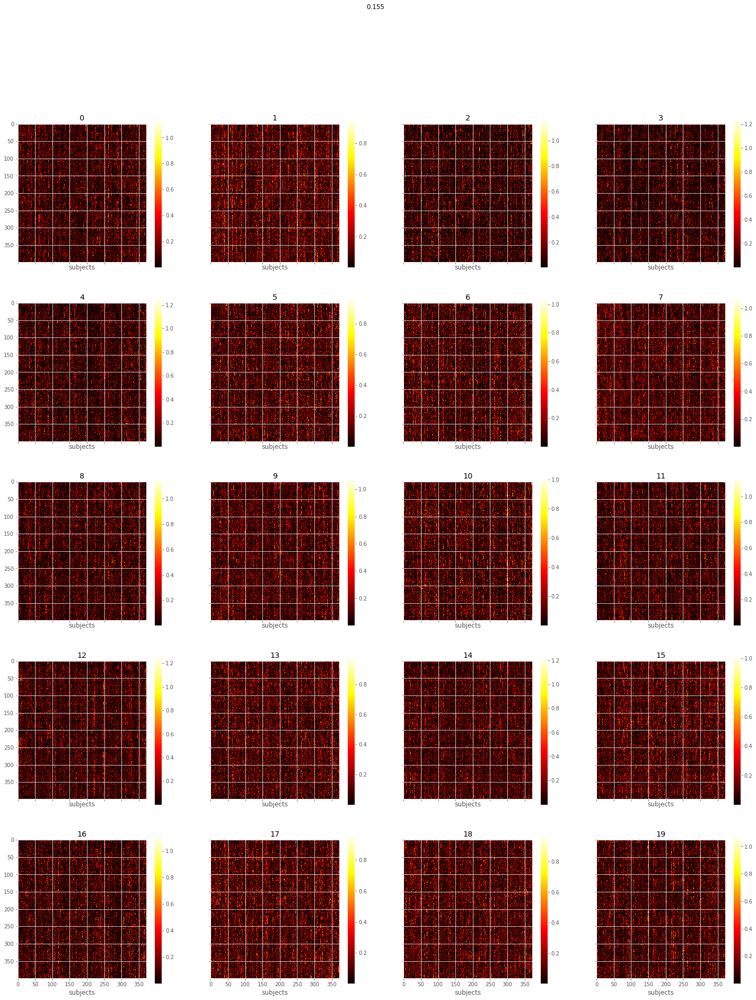

In [126]:
fig, axs = plt.subplots(p//4, 4, figsize=(25,30), sharex=True, sharey=True)
for w, ax, comp in zip(model.vars['w'].numpy().transpose((2,1,0)), axs.flat, np.arange(p)):
    im = ax.imshow(np.abs(w), cmap='hot')
    ax.set_title(comp)
    fig.colorbar(im, ax=ax)
    ax.set_xlabel('subjects')
    fig.suptitle(model.reg)

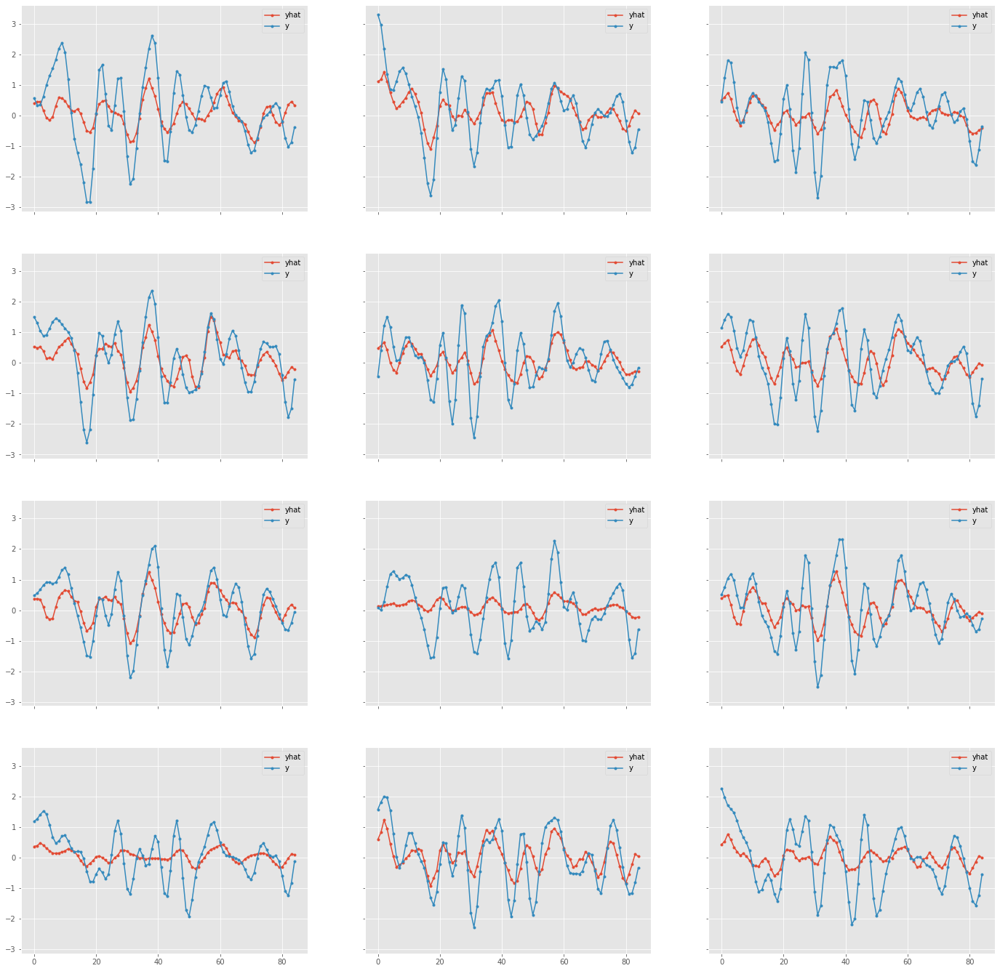

In [127]:
y_hat = model.vars['w'].numpy() @ model.vars['x'].numpy()
t = data.shape[-1]

n_rows = 4
n_cols = 3
sub = 198

fig, axs = plt.subplots(n_rows, n_cols, figsize=(8 * n_cols, 6 * n_rows), sharex=True, sharey=True)
for _y_hat, _y, ax in zip(y_hat[sub], data[sub], axs.flat):
    ax.plot(np.arange(t), _y_hat, marker='.', label='yhat')
    ax.plot(np.arange(t), _y, marker='.', label='y')
    ax.legend()

In [128]:
w, l = model.add_subject(data[0:10])
print(l)

tf.Tensor(86837.14, shape=(), dtype=float32)


100%|██████████| 2000/2000 [00:23<00:00, 85.86it/s]


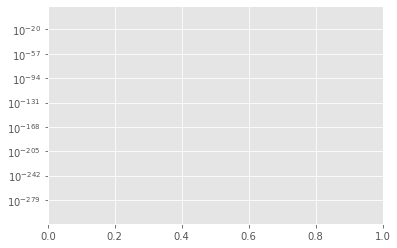

In [129]:
from shared_gpfa import SharedGpfa

valid = load_ea_data(vid=2)[0]

x, l = model.add_video(valid, n_iters=2000, learning_rate=0.01)#plt.plot(l)
plt.yscale('log')

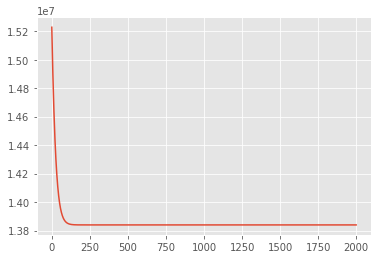

In [130]:
plt.plot(l)
# plt.yscale('log')

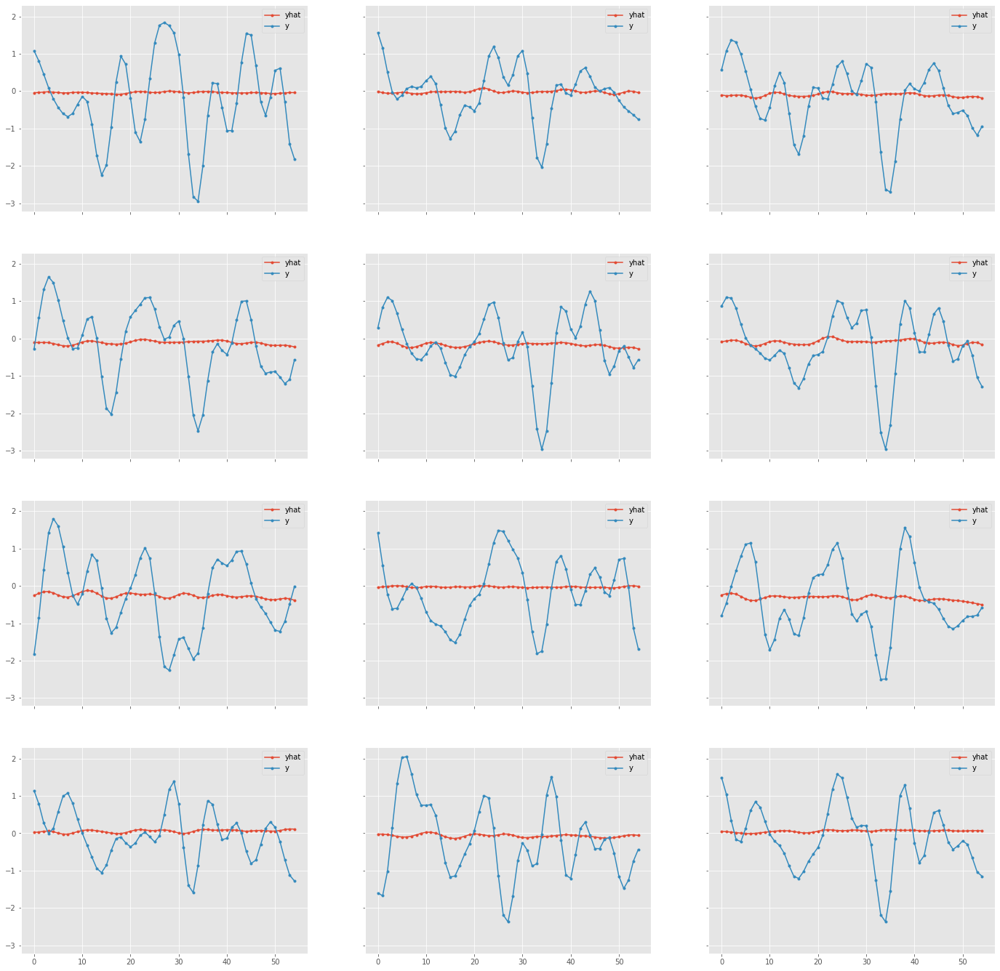

In [132]:
y_hat = model.vars['w'].numpy() @ x
t = valid.shape[-1]

n_rows = 4
n_cols = 3
sub = 11

fig, axs = plt.subplots(n_rows, n_cols, figsize=(8*n_cols, 6*n_rows), sharex=True, sharey=True)
for _y_hat, _y, ax in zip(y_hat[sub], valid[sub], axs.flat):
    ax.plot(np.arange(t), _y_hat, marker='.', label='yhat')
    ax.plot(np.arange(t), _y, marker='.', label='y')
    ax.legend()

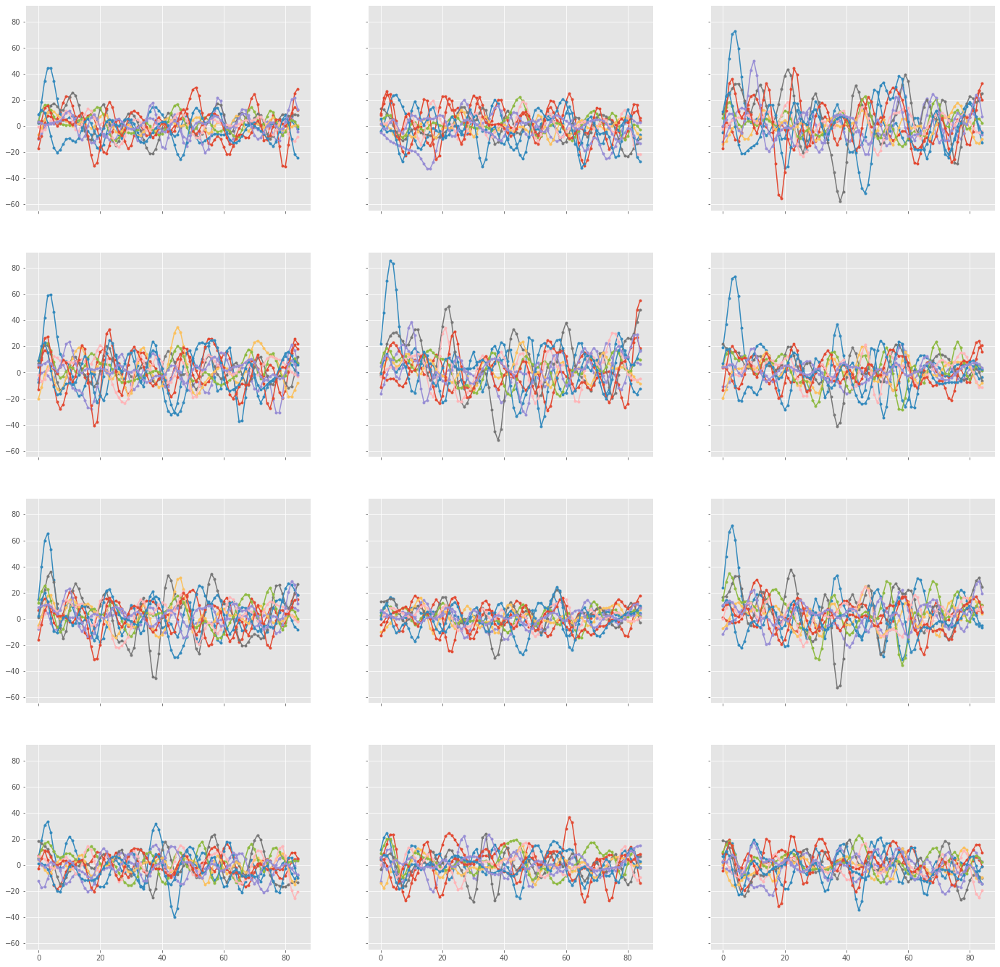

In [12]:
n_rows = 4
n_cols = 3

fig, axs = plt.subplots(n_rows, n_cols, figsize=(8 * n_cols, 6 * n_rows), sharex=True, sharey=True)

for d, ax in zip(np.transpose(data[:10], (1, 0, 2)), axs.flat):
    ax.plot(np.arange(t), d.T, marker='.')
